# Ноутбук №1: детекция транспортных средств и номерных знаков


**Задачи ноутбука:**
1. Детекция транспортных средств с помощью YOLOv8n, предобученной на COCO.
2. Дообучение YOLOv8n для детекции номерных знаков.
3. Распознавание текста номерного знака с помощью EasyOCR.
4. Оценка качества: mAP@0.5 для детекции, CER / CRR / Plate Accuracy для OCR.


**Основной результат:** обученная модель `yolov8n_plates.pt` для детекции номерных знаков.

In [1]:
%%capture
!pip install -q ultralytics easyocr opencv-python-headless Pillow matplotlib numpy pandas tensorboard

In [2]:
import os, re, json, time
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import cv2
import warnings
warnings.filterwarnings('ignore')

try:
    from google.colab.patches import cv2_imshow
    IN_COLAB = True
except ImportError:
    IN_COLAB = False
    def cv2_imshow(img):
        plt.figure(figsize=(14, 7))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off'); plt.tight_layout(); plt.show()

import torch
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

WORK_DIR   = Path('diploma_01_detection')
OUTPUT_DIR = WORK_DIR / 'output'
DATA_DIR   = WORK_DIR / 'data'
MODELS_DIR = WORK_DIR / 'models'
for d in [OUTPUT_DIR, DATA_DIR, MODELS_DIR]:
    d.mkdir(parents=True, exist_ok=True)

print(f'Device: {DEVICE}')

Device: cuda


### Все модели логируются в Google Drive

In [3]:
if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    DRIVE_MODELS = Path('/content/drive/MyDrive/diploma/models')
else:
    DRIVE_MODELS = MODELS_DIR
DRIVE_MODELS.mkdir(parents=True, exist_ok=True)
PLATES_MODEL_PATH = DRIVE_MODELS / 'yolov8n_plates.pt'
print(f'Модели логируются по пути: {DRIVE_MODELS}')

Mounted at /content/drive
Модели логируются по пути: /content/drive/MyDrive/diploma/models


## 2. Детекция транспортных средств — YOLOv8n, предобученная на COCO

| ID класса COCO | Класс | Описание |
|---:|---|---|
| 2 | car | автомобиль |
| 3 | motorcycle | мотоцикл |
| 5 | bus | автобус |
| 7 | truck | грузовик |

In [4]:
from ultralytics import YOLO

vehicle_model   = YOLO('yolov8n.pt')
VEHICLE_CLASSES = {2: 'car', 3: 'motorcycle', 5: 'bus', 7: 'truck'}

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


### Тест на реальном изображении

Загружено: /content/drive/MyDrive/diploma/test_images/rr.jpg  |  размер: 1200x799


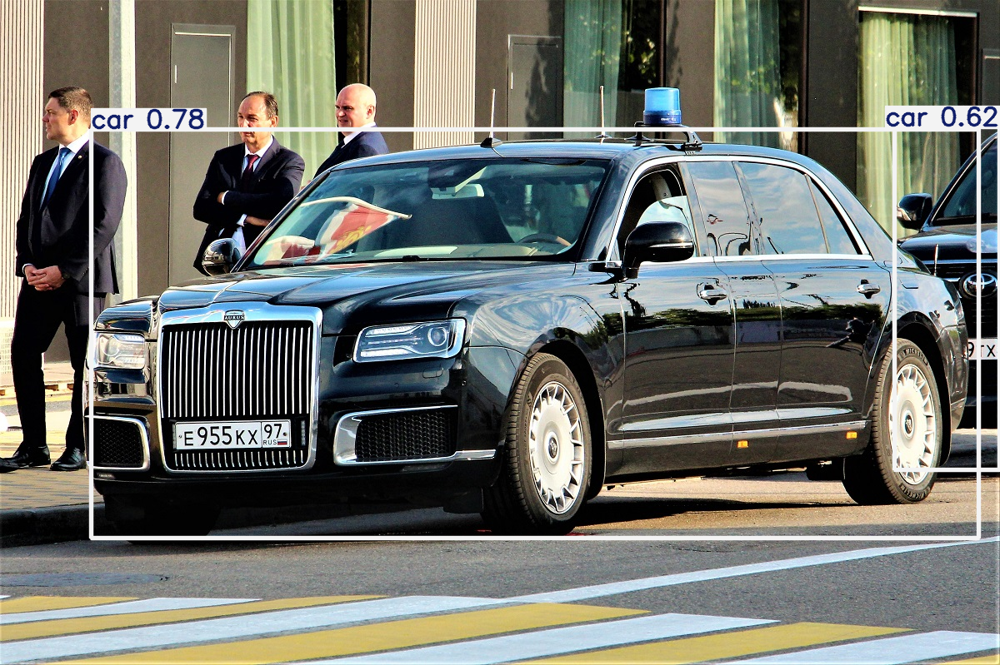

Обнаружено: 2 объект(ов)
  car           conf=0.781
  car           conf=0.618


In [5]:
# ── Загрузка тестового изображения из Google Drive ───────────────────────────
# Положите rr.jpg в папку MyDrive/diploma/test_images/

from google.colab.patches import cv2_imshow

img_path = '/content/drive/MyDrive/diploma/test_images/rr.jpg'
img = cv2.imread(img_path)
assert img is not None, f'Файл не найден: {img_path}'
print(f'Загружено: {img_path}  |  размер: {img.shape[1]}x{img.shape[0]}')

res = vehicle_model(img, conf=0.4, classes=list(VEHICLE_CLASSES.keys()), verbose=False)[0]
annotated = res.plot()
cv2_imshow(annotated)
cv2.imwrite(str(OUTPUT_DIR / 'vehicle_detection_demo.jpg'), annotated)

print(f'Обнаружено: {len(res.boxes)} объект(ов)')
for b in res.boxes:
    cid = int(b.cls.item())
    print(f'  {VEHICLE_CLASSES.get(cid,"?"):12s}  conf={b.conf.item():.3f}')


## 3. Детекция номерных знаков — Fine-tuning YOLOv8n


### Скачиваем датасет

In [6]:
import os, shutil, random, xml.etree.ElementTree as ET
from pathlib import Path
from PIL import Image

PLATES_DIR = DATA_DIR / 'plates'
RAW_DIR    = PLATES_DIR / 'raw'
RAW_DIR.mkdir(parents=True, exist_ok=True)

if not any(RAW_DIR.glob('*.jpg')) and not any(RAW_DIR.glob('*.png')):
    !pip install -q kaggle
    !kaggle datasets download -d andrewmvd/car-plate-detection -p {str(RAW_DIR)} --unzip
    print('Датасет скачан.')
else:
    print('Датасет уже скачан, пропускаем.')

Dataset URL: https://www.kaggle.com/datasets/andrewmvd/car-plate-detection
License(s): CC0-1.0
100% 203M/203M [00:01<00:00, 159MB/s]

Датасет скачан.


### Ищем изображения и аннотации

In [7]:
img_files = sorted(list(RAW_DIR.rglob('*.jpg')) + list(RAW_DIR.rglob('*.png')))
xml_files = sorted(RAW_DIR.rglob('*.xml'))
print(f'Найдено: {len(img_files)} изображений, {len(xml_files)} XML-аннотаций')

assert len(img_files) > 0, 'Изображения не найдены. Проверь скачивание датасета.'
assert len(xml_files) > 0, 'XML-файлы не найдены. Датасет должен содержать Pascal VOC аннотации.'

Найдено: 433 изображений, 433 XML-аннотаций


### Конвертируем Pascal VOC XML в YOLO txt и сплитим дату на трейн и тест

In [8]:
# ── 4. Pascal VOC XML → YOLO txt ─────────────────────────────────────────────
def voc_xml_to_yolo(xml_path):
    """Конвертирует Pascal VOC XML в строки YOLO формата (class cx cy w h)."""
    tree = ET.parse(xml_path)
    root = tree.getroot()
    size = root.find('size')
    W = int(size.find('width').text)
    H = int(size.find('height').text)
    lines = []
    for obj in root.findall('object'):
        bb = obj.find('bndbox')
        xmin = float(bb.find('xmin').text)
        ymin = float(bb.find('ymin').text)
        xmax = float(bb.find('xmax').text)
        ymax = float(bb.find('ymax').text)
        cx = (xmin + xmax) / 2 / W
        cy = (ymin + ymax) / 2 / H
        w  = (xmax - xmin) / W
        h  = (ymax - ymin) / H
        lines.append(f'0 {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}')
    return lines

# ── 5. Разбить на train/test (80/20 holdout) и сохранить ─────────────────────
xml_map = {x.stem: x for x in xml_files}
pairs   = [(img, xml_map[img.stem]) for img in img_files if img.stem in xml_map]
print(f'Пар img+xml: {len(pairs)}')

random.seed(42)
random.shuffle(pairs)
n_test = max(1, int(len(pairs) * 0.2))
splits = {'test': pairs[:n_test], 'train': pairs[n_test:]}

for split, items in splits.items():
    (PLATES_DIR / split / 'images').mkdir(parents=True, exist_ok=True)
    (PLATES_DIR / split / 'labels').mkdir(parents=True, exist_ok=True)
    for img_path_src, xml_path_src in items:
        dst_img = PLATES_DIR / split / 'images' / img_path_src.name
        dst_lbl = PLATES_DIR / split / 'labels' / (img_path_src.stem + '.txt')
        shutil.copy(img_path_src, dst_img)
        lines = voc_xml_to_yolo(xml_path_src)
        dst_lbl.write_text('\n'.join(lines))

print(f'train: {len(splits["train"])} | test: {len(splits["test"])}')

Пар img+xml: 433
train: 347 | test: 86


### Fine-tuning YOLOv8

In [9]:
DATA_YAML = str(PLATES_DIR / 'dataset.yaml')
yaml_content = f"""path: {PLATES_DIR.resolve()}
train: train/images
val:   test/images
nc: 1
names: ['license_plate']
"""
Path(DATA_YAML).write_text(yaml_content)
print(f'dataset.yaml -> {DATA_YAML}')

plate_model = YOLO('yolov8n.pt')
plate_model.train(
    data     = DATA_YAML,
    epochs   = 50,
    batch    = 16,
    imgsz    = 640,
    device   = DEVICE,
    project  = str(WORK_DIR / 'runs'),
    name     = 'plates',
    patience = 15,
    val      = True,
)

best = Path(plate_model.trainer.best)
shutil.copy(best, PLATES_MODEL_PATH)
print(f'Веса -> {PLATES_MODEL_PATH}')

dataset.yaml -> diploma_01_detection/data/plates/dataset.yaml
Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=diploma_01_detection/data/plates/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=plates, nbs=64, nms=False, 

results.csv: 50 эпох, столбцы: ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']


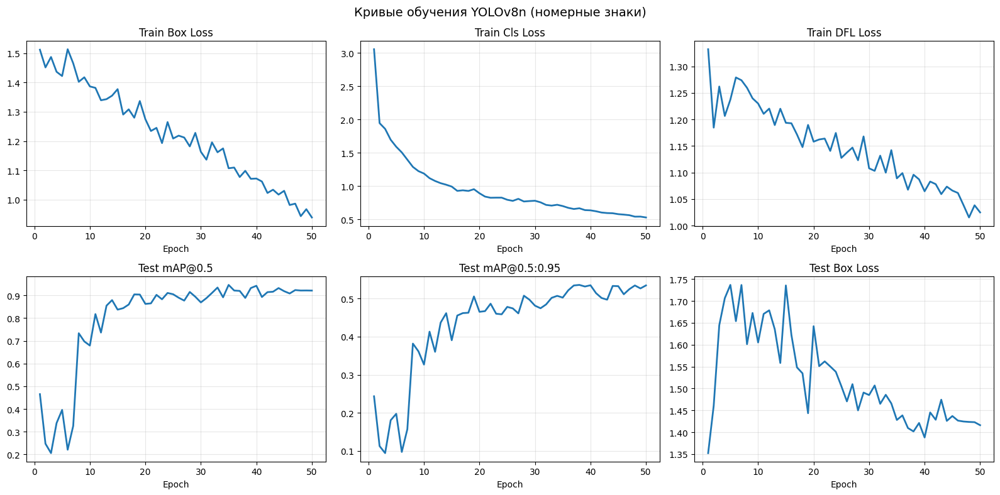

График -> diploma_01_detection/output/training_curves.png


In [10]:
import pandas as pd

_csv_path = Path(plate_model.trainer.save_dir) / 'results.csv'
_df = pd.read_csv(_csv_path)
_df.columns = _df.columns.str.strip()
print(f'results.csv: {len(_df)} эпох, столбцы: {list(_df.columns)}')

fig, axes = plt.subplots(2, 3, figsize=(16, 8))
fig.suptitle('Кривые обучения YOLOv8n (номерные знаки)', fontsize=14)

_plots = [
    ('train/box_loss',      'Train Box Loss',      axes[0, 0]),
    ('train/cls_loss',      'Train Cls Loss',      axes[0, 1]),
    ('train/dfl_loss',      'Train DFL Loss',      axes[0, 2]),
    ('metrics/mAP50(B)',    'Test mAP@0.5',         axes[1, 0]),
    ('metrics/mAP50-95(B)', 'Test mAP@0.5:0.95',   axes[1, 1]),
    ('val/box_loss',        'Test Box Loss',        axes[1, 2]),
]

for _col, _label, _ax in _plots:
    if _col in _df.columns:
        _ax.plot(_df['epoch'], _df[_col], linewidth=2)
        _ax.set_title(_label); _ax.set_xlabel('Epoch')
        _ax.grid(True, alpha=0.3)
    else:
        _ax.set_visible(False)

plt.tight_layout()
_out = OUTPUT_DIR / 'training_curves.png'
plt.savefig(str(_out), dpi=130, bbox_inches='tight')
plt.show()
print(f'График -> {_out}')

Папка с результатами обучения: /content/runs/detect/diploma_01_detection/runs/plates
Найдено PNG: ['BoxF1_curve.png', 'BoxPR_curve.png', 'BoxP_curve.png', 'BoxR_curve.png', 'confusion_matrix.png', 'confusion_matrix_normalized.png', 'results.png']


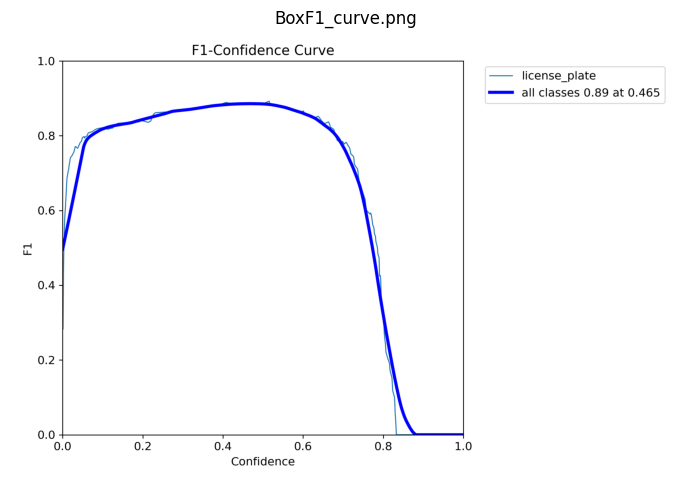

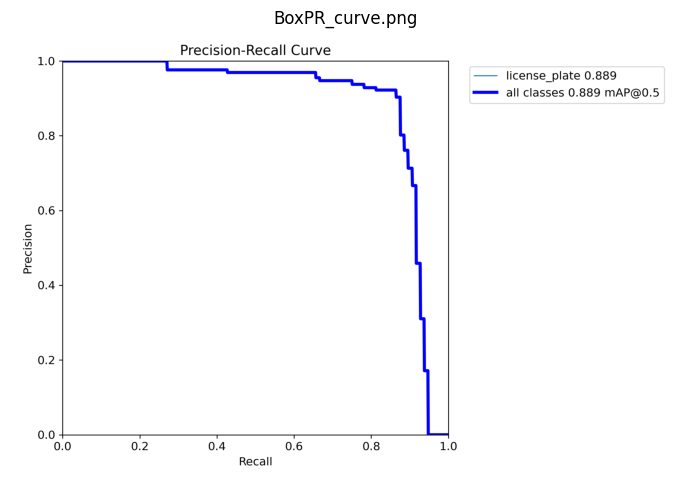

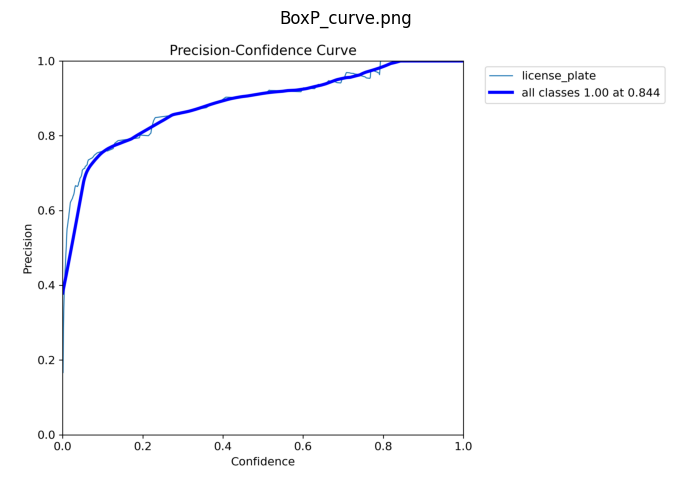

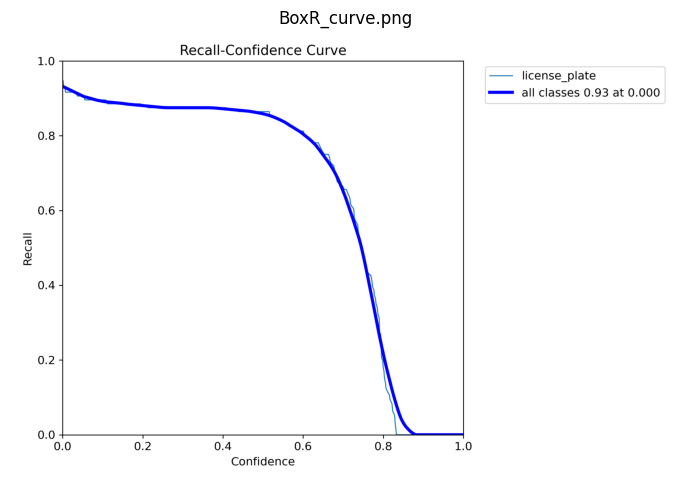

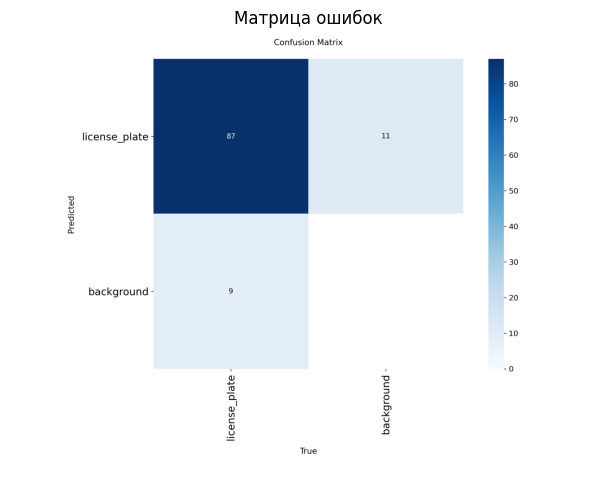

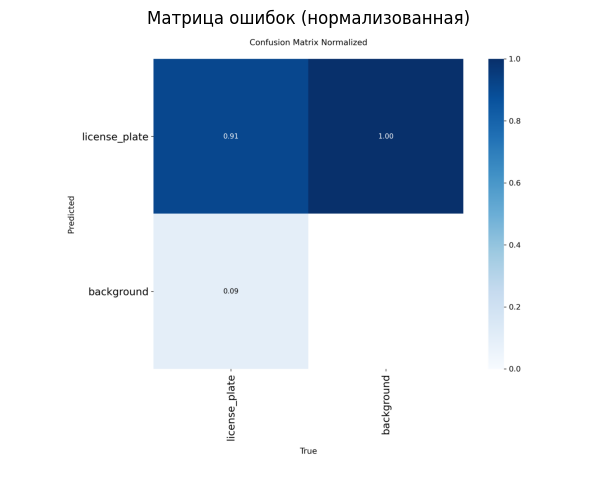

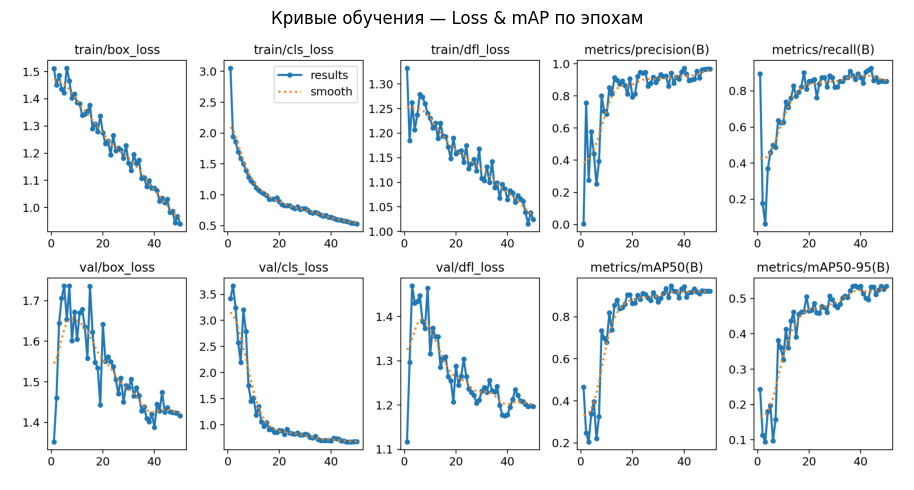

In [11]:
# ── Графики обучения (автоматически сохранённые YOLO) ─────────────────────────
import matplotlib.image as _mpimg

_save_dir = Path(plate_model.trainer.save_dir)
print(f'Папка с результатами обучения: {_save_dir}')

# Находим все PNG, которые YOLO сохранил (имена могут меняться по версиям)
_all_plots = sorted(_save_dir.glob('*.png'))
print(f'Найдено PNG: {[p.name for p in _all_plots]}')

# Приоритетный список с подписями; остальные показываются по имени файла
_KNOWN = {
    'results.png':                     'Кривые обучения — Loss & mAP по эпохам',
    'confusion_matrix_normalized.png': 'Матрица ошибок (нормализованная)',
    'confusion_matrix.png':            'Матрица ошибок',
    'PR_curve.png':                    'Precision-Recall кривая',
    'P_curve.png':                     'Precision-кривая',
    'R_curve.png':                     'Recall-кривая',
    'F1_curve.png':                    'F1-кривая по порогу уверенности',
}

for _p in _all_plots:
    _title = _KNOWN.get(_p.name, _p.name)
    _img = _mpimg.imread(str(_p))
    plt.figure(figsize=(13, 5))
    plt.imshow(_img)
    plt.title(_title, fontsize=12)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Примечание: для однокласового детектора матрица ошибок включает
# «background» — это штатное поведение YOLO, не ошибка.


In [12]:
# ── Оценка детектора номеров ──────────────────────────────────────────────────
plate_eval  = YOLO(str(PLATES_MODEL_PATH))
metrics     = plate_eval.val(data=DATA_YAML, device=DEVICE, verbose=False)
map50       = metrics.box.map50
map5095     = metrics.box.map
print(f'mAP@0.5:      {map50:.4f}')
print(f'mAP@0.5:0.95: {map5095:.4f}')

with open(OUTPUT_DIR / 'detection_metrics.json', 'w') as f:
    json.dump({'map50': round(map50,4), 'map5095': round(map5095,4)}, f, indent=2)
print(f'Метрики → {OUTPUT_DIR}/detection_metrics.json')

Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2942.6±870.0 MB/s, size: 325.2 KB)
val: Scanning /content/diploma_01_detection/data/plates/test/labels.cache... 86 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 86/86 20.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 1.6it/s 3.9s
                   all         86         96      0.906      0.865      0.889      0.539
Speed: 6.5ms preprocess, 16.6ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to /content/runs/detect/val
mAP@0.5:      0.8892
mAP@0.5:0.95: 0.5390
Метрики → diploma_01_detection/output/detection_metrics.json


## 2.1 До / После fine-tuning: сравнение детекции номеров

Один и тот же кадр из test-выборки обрабатывается **pretrained YOLOv8n** (общая модель COCO, не знает о номерах) и **дообученным** детектором. Наглядно видно разницу в качестве локализации.

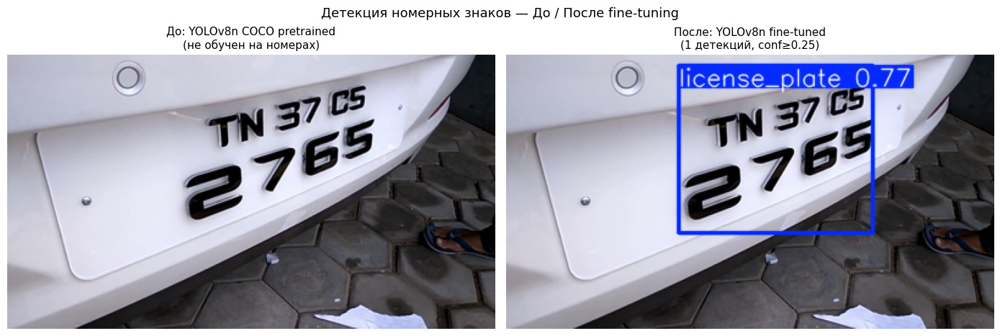

In [13]:
# ── До/после fine-tuning: сравнение на одном кадре test-выборки ──────────────
_test_dir  = PLATES_DIR / 'test' / 'images'
_test_imgs = sorted(list(_test_dir.glob('*.jpg')) + list(_test_dir.glob('*.png')))
assert len(_test_imgs) > 0, (
    'test-выборка пуста — сначала запустите ячейку разбивки датасета (train/test split)'
)
_sample_bgr = cv2.imread(str(_test_imgs[0]))

# Загружаем fine-tuned модель
_plate_eval_model = YOLO(str(PLATES_MODEL_PATH))

# Pretrained YOLOv8n (COCO — не обучен на номерах)
_res_before = vehicle_model(_sample_bgr, conf=0.25, verbose=False)[0]
_ann_before = _res_before.plot()

# Fine-tuned детектор номеров
_res_after = _plate_eval_model(_sample_bgr, conf=0.25, verbose=False)[0]
_ann_after = _res_after.plot()

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].imshow(cv2.cvtColor(_ann_before, cv2.COLOR_BGR2RGB))
axes[0].set_title('До: YOLOv8n COCO pretrained\n(не обучен на номерах)', fontsize=11)
axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(_ann_after, cv2.COLOR_BGR2RGB))
axes[1].set_title(
    f'После: YOLOv8n fine-tuned\n({len(_res_after.boxes)} детекций, conf≥0.25)', fontsize=11)
axes[1].axis('off')
plt.suptitle('Детекция номерных знаков — До / После fine-tuning', fontsize=13)
plt.tight_layout()
plt.savefig(str(OUTPUT_DIR / 'before_after_finetuning.png'), dpi=130, bbox_inches='tight')
plt.show()

## 2.2 Влияние порога уверенности (conf)

При **низком** пороге модель находит больше объектов, но появляются ложные срабатывания. При **высоком** пороге — только уверенные детекции, но можно пропустить мелкие/далёкие номера. Ниже — один и тот же кадр при `conf = 0.2 / 0.4 / 0.6 / 0.8`.

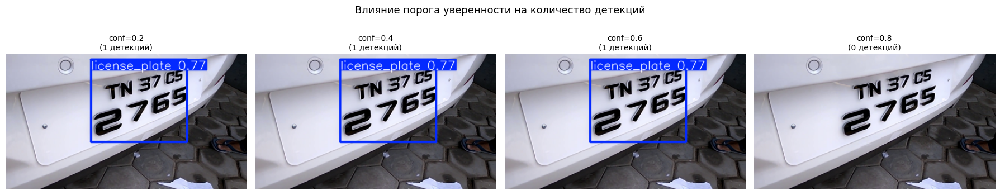

In [14]:
# ── Grid: один кадр при разных порогах уверенности ──────────────────────────
_CONFS = [0.2, 0.4, 0.6, 0.8]
fig, axes = plt.subplots(1, 4, figsize=(18, 4))
for ax, conf in zip(axes, _CONFS):
    _res = _plate_eval_model(_sample_bgr, conf=conf, verbose=False)[0]
    _ann = _res.plot()
    ax.imshow(cv2.cvtColor(_ann, cv2.COLOR_BGR2RGB))
    ax.set_title(f'conf={conf}\n({len(_res.boxes)} детекций)', fontsize=10)
    ax.axis('off')
plt.suptitle('Влияние порога уверенности на количество детекций', fontsize=13)
plt.tight_layout()
plt.savefig(str(OUTPUT_DIR / 'conf_threshold_grid.png'), dpi=130, bbox_inches='tight')
plt.show()

## 2.3 Примеры ошибок детектора (test-выборка)

Визуализируем кадры, где детектор **пропустил номер** (False Negative — IoU с GT < 0.5). **Зелёный** прямоугольник — ground truth разметка, **синий** — предсказание модели (если есть). Это помогает понять, в каких условиях модель слабее всего.

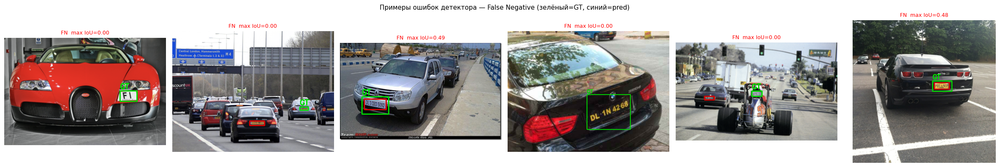

Показано 6 False Negative примеров


In [15]:
def _gt_boxes_from_label(lbl_path, img_w, img_h):
    """Читает YOLO-формат .txt → список [x1, y1, x2, y2] в пикселях."""
    boxes = []
    if not Path(lbl_path).exists():
        return boxes
    for line in Path(lbl_path).read_text().strip().splitlines():
        parts = line.split()
        if len(parts) < 5:
            continue
        cx, cy, w, h = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
        x1 = int((cx - w / 2) * img_w); y1 = int((cy - h / 2) * img_h)
        x2 = int((cx + w / 2) * img_w); y2 = int((cy + h / 2) * img_h)
        boxes.append([x1, y1, x2, y2])
    return boxes

def _iou(a, b):
    ix1, iy1 = max(a[0], b[0]), max(a[1], b[1])
    ix2, iy2 = min(a[2], b[2]), min(a[3], b[3])
    inter = max(0, ix2 - ix1) * max(0, iy2 - iy1)
    ua = (a[2]-a[0])*(a[3]-a[1]) + (b[2]-b[0])*(b[3]-b[1]) - inter
    return inter / ua if ua > 0 else 0.0

_test_dir  = PLATES_DIR / 'test' / 'images'
_test_imgs = sorted(list(_test_dir.glob('*.jpg')) + list(_test_dir.glob('*.png')))
_test_lbls = PLATES_DIR / 'test' / 'labels'
_fn_examples = []
for _img_p in _test_imgs[:80]:
    _lbl_p = _test_lbls / (_img_p.stem + '.txt')
    _bgr   = cv2.imread(str(_img_p))
    if _bgr is None: continue
    H, W   = _bgr.shape[:2]
    _gt    = _gt_boxes_from_label(_lbl_p, W, H)
    if not _gt: continue
    _preds = _plate_eval_model(_bgr, conf=0.3, verbose=False)[0].boxes
    _pred_boxes = [list(map(int, b.xyxy[0].cpu().numpy())) for b in _preds] if _preds else []
    for _gt_box in _gt:
        max_iou = max((_iou(_gt_box, pb) for pb in _pred_boxes), default=0.0)
        if max_iou < 0.5:
            _fn_examples.append((_bgr.copy(), _gt_box, _pred_boxes, max_iou))
    if len(_fn_examples) >= 6:
        break

if not _fn_examples:
    print('False Negative не найдено в первых 80 кадрах — модель работает хорошо!')
else:
    n = len(_fn_examples)
    fig, axes = plt.subplots(1, n, figsize=(4 * n, 4))
    if n == 1: axes = [axes]
    for ax, (_bgr_ex, _gt_b, _pred_bs, _max_iou) in zip(axes, _fn_examples):
        _vis = _bgr_ex.copy()
        cv2.rectangle(_vis, (_gt_b[0], _gt_b[1]), (_gt_b[2], _gt_b[3]), (0, 220, 0), 2)
        cv2.putText(_vis, 'GT', (_gt_b[0], _gt_b[1] - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 220, 0), 2)
        for _pb in _pred_bs:
            cv2.rectangle(_vis, (_pb[0], _pb[1]), (_pb[2], _pb[3]), (0, 0, 220), 2)
        ax.imshow(cv2.cvtColor(_vis, cv2.COLOR_BGR2RGB))
        ax.set_title(f'FN  max IoU={_max_iou:.2f}', fontsize=9, color='red')
        ax.axis('off')
    plt.suptitle('Примеры ошибок детектора — False Negative (зелёный=GT, синий=pred)', fontsize=11)
    plt.tight_layout()
    plt.savefig(str(OUTPUT_DIR / 'detection_errors_fn.png'), dpi=130, bbox_inches='tight')
    plt.show()
    print(f'Показано {n} False Negative примеров')

## 2.4 IoU-анализ: распределение по test-выборке

Гистограмма **IoU** (Intersection over Union) между предсказанными bbox и ground truth показывает, насколько точно модель локализует номерные знаки. Хорошая модель имеет пик ближе к 1.0. График CDF показывает, какой процент боксов набирает IoU выше заданного порога.

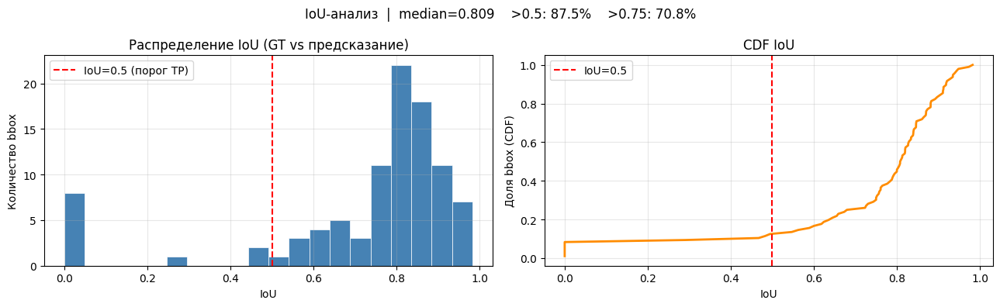

Всего GT-боксов: 96
Median IoU:      0.8090
IoU ≥ 0.5:       87.5%
IoU ≥ 0.75:      70.8%


In [16]:
# ── IoU-анализ по всей test-выборке ─────────────────────────────────────────
_test_dir  = PLATES_DIR / 'test' / 'images'
_test_imgs = sorted(list(_test_dir.glob('*.jpg')) + list(_test_dir.glob('*.png')))
_test_lbls = PLATES_DIR / 'test' / 'labels'
_all_ious = []
for _img_p in _test_imgs:
    _lbl_p = _test_lbls / (_img_p.stem + '.txt')
    _bgr   = cv2.imread(str(_img_p))
    if _bgr is None: continue
    H, W   = _bgr.shape[:2]
    _gt    = _gt_boxes_from_label(_lbl_p, W, H)
    if not _gt: continue
    _preds = _plate_eval_model(_bgr, conf=0.3, verbose=False)[0].boxes
    _pred_boxes = [list(map(int, b.xyxy[0].cpu().numpy())) for b in _preds] if _preds else []
    for _gt_box in _gt:
        best_iou = max((_iou(_gt_box, pb) for pb in _pred_boxes), default=0.0)
        _all_ious.append(best_iou)

if _all_ious:
    _arr = np.array(_all_ious)
    fig, axes = plt.subplots(1, 2, figsize=(13, 4))

    axes[0].hist(_arr, bins=20, color='steelblue', edgecolor='white', linewidth=0.5)
    axes[0].axvline(0.5, color='red', linestyle='--', label='IoU=0.5 (порог TP)')
    axes[0].set_xlabel('IoU'); axes[0].set_ylabel('Количество bbox')
    axes[0].set_title('Распределение IoU (GT vs предсказание)')
    axes[0].legend(); axes[0].grid(True, alpha=0.3)

    _sorted = np.sort(_arr)
    _cdf    = np.arange(1, len(_sorted) + 1) / len(_sorted)
    axes[1].plot(_sorted, _cdf, color='darkorange', linewidth=2)
    axes[1].axvline(0.5, color='red', linestyle='--', label='IoU=0.5')
    axes[1].set_xlabel('IoU'); axes[1].set_ylabel('Доля bbox (CDF)')
    axes[1].set_title('CDF IoU')
    axes[1].legend(); axes[1].grid(True, alpha=0.3)

    plt.suptitle(
        f'IoU-анализ  |  median={np.median(_arr):.3f}  '
        f'  >0.5: {(_arr >= 0.5).mean() * 100:.1f}%  '
        f'  >0.75: {(_arr >= 0.75).mean() * 100:.1f}%', fontsize=12)
    plt.tight_layout()
    plt.savefig(str(OUTPUT_DIR / 'iou_analysis.png'), dpi=130, bbox_inches='tight')
    plt.show()
    print(f'Всего GT-боксов: {len(_arr)}')
    print(f'Median IoU:      {np.median(_arr):.4f}')
    print(f'IoU ≥ 0.5:       {(_arr >= 0.5).mean() * 100:.1f}%')
    print(f'IoU ≥ 0.75:      {(_arr >= 0.75).mean() * 100:.1f}%')
else:
    print('Нет данных для IoU-анализа')

## 3. OCR номерных знаков — EasyOCR

Формат российского номера: `[АВЕКМНОРСТУХ]\d{3}[АВЕКМНОРСТУХ]{2}\d{2,3}`

In [17]:
import easyocr

reader = easyocr.Reader(['ru', 'en'], gpu=(DEVICE == 'cuda'), verbose=False)
print('EasyOCR загружен.')

# 12 кириллических букв в российских номерных знаках (имеют графические аналоги в латинице)
_PLATE_LETTERS = 'АВЕКМНОРСТУХ'
_LAT_TO_RUS = str.maketrans({
    'A': 'А', 'B': 'В', 'E': 'Е', 'K': 'К', 'M': 'М', 'H': 'Н',
    'O': 'О', 'P': 'Р', 'C': 'С', 'T': 'Т', 'X': 'Х', 'Y': 'У',
})
_RU_RE = re.compile(rf'[{_PLATE_LETTERS}]\d{{3}}[{_PLATE_LETTERS}]{{2}}\d{{2,3}}')

def ocr_plate(plate_bgr: np.ndarray) -> dict:
    res = reader.readtext(plate_bgr, detail=1)
    if not res:
        return {'text': '', 'confidence': 0.0, 'valid': False}
    raw  = ' '.join(t for (_, t, c) in res if c > 0.4)
    text = raw.upper().replace(' ', '').replace('-', '').translate(_LAT_TO_RUS)
    m    = _RU_RE.search(text)
    conf = sum(c for (_, _, c) in res) / max(len(res), 1)
    return {'text': m.group(0) if m else text,
            'confidence': round(conf, 3),
            'valid': m is not None}

EasyOCR загружен.


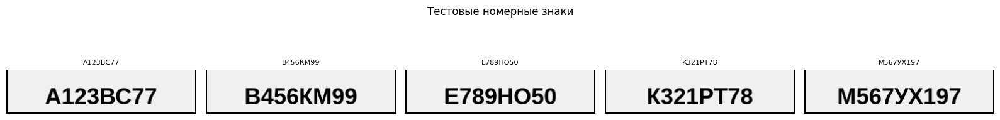

In [18]:
# ── Тест OCR на синтетических номерах ────────────────────────────────────────
from PIL import Image as _PILImage, ImageDraw as _PILDraw, ImageFont as _PILFont

def make_plate_img(text, w=300, h=70):
    """Рендер номерного знака с поддержкой кириллицы через PIL."""
    img_pil = _PILImage.new('RGB', (w, h), color=(240, 240, 240))
    draw = _PILDraw.Draw(img_pil)
    draw.rectangle([(0, 0), (w-1, h-1)], outline=(0, 0, 0), width=2)

    # Ищем шрифт с кириллицей (DejaVu есть в Ubuntu/Colab)
    font = None
    for _fp in [
        '/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf',
        '/usr/share/fonts/truetype/liberation/LiberationSans-Bold.ttf',
        '/usr/share/fonts/truetype/freefont/FreeSansBold.ttf',
    ]:
        try:
            font = _PILFont.truetype(_fp, 36)
            break
        except OSError:
            continue
    if font is None:
        font = _PILFont.load_default()

    bbox = draw.textbbox((0, 0), text, font=font)
    tw, th = bbox[2] - bbox[0], bbox[3] - bbox[1]
    x = max((w - tw) // 2, 4)
    y = max((h - th) // 2, 2)
    draw.text((x, y), text, fill=(0, 0, 0), font=font)

    import cv2 as _cv2
    return _cv2.cvtColor(np.array(img_pil), _cv2.COLOR_RGB2BGR)

test_plates = ['А123ВС77', 'В456КМ99', 'Е789НО50', 'К321РТ78', 'М567УХ197']
fig, axes   = plt.subplots(1, len(test_plates), figsize=(16, 2.5))
for i, text in enumerate(test_plates):
    axes[i].imshow(cv2.cvtColor(make_plate_img(text), cv2.COLOR_BGR2RGB))
    axes[i].set_title(text, fontsize=8); axes[i].axis('off')
plt.suptitle('Тестовые номерные знаки')
plt.tight_layout(); plt.savefig(str(OUTPUT_DIR / 'test_plates.png'), dpi=120); plt.show()


In [19]:
# ── Метрики OCR ───────────────────────────────────────────────────────────────
def cer(ref, hyp):
    if not ref: return 0.0 if not hyp else 1.0
    d = np.zeros((len(ref)+1, len(hyp)+1), dtype=int)
    for i in range(len(ref)+1): d[i][0] = i
    for j in range(len(hyp)+1): d[0][j] = j
    for i in range(1,len(ref)+1):
        for j in range(1,len(hyp)+1):
            cost = 0 if ref[i-1]==hyp[j-1] else 1
            d[i][j] = min(d[i-1][j]+1, d[i][j-1]+1, d[i-1][j-1]+cost)
    return d[len(ref)][len(hyp)] / len(ref)

results_ocr = []
for text in test_plates:
    r = ocr_plate(make_plate_img(text))
    c = cer(text, r['text'])
    results_ocr.append({'reference': text, 'recognized': r['text'],
                        'valid': r['valid'], 'confidence': r['confidence'], 'cer': round(c,4)})
    status = '✓' if r['text'] == text else '✗'
    print(f'  {status}  {text:12s} → {r["text"]:12s}  conf={r["confidence"]:.2f}  CER={c:.3f}')

plate_acc = sum(r['reference'] == r['recognized'] for r in results_ocr) / len(results_ocr)
mean_cer  = float(np.mean([r['cer'] for r in results_ocr]))
print(f'\nPlate Accuracy: {plate_acc:.4f}')
print(f'Mean CRR:       {1-mean_cer:.4f}')

with open(OUTPUT_DIR / 'ocr_metrics.json', 'w', encoding='utf-8') as f:
    json.dump({'plate_accuracy': round(plate_acc,4),
               'mean_cer': round(mean_cer,4),
               'mean_crr': round(1-mean_cer,4),
               'details': results_ocr}, f, ensure_ascii=False, indent=2)

  ✓  А123ВС77     → А123ВС77      conf=0.70  CER=0.000
  ✓  В456КМ99     → В456КМ99      conf=0.97  CER=0.000
  ✓  Е789НО50     → Е789НО50      conf=0.43  CER=0.000
  ✗  К321РТ78     → КЗ21РТ78      conf=1.00  CER=0.125
  ✓  М567УХ197    → М567УХ197     conf=0.73  CER=0.000

Plate Accuracy: 0.8000
Mean CRR:       0.9750


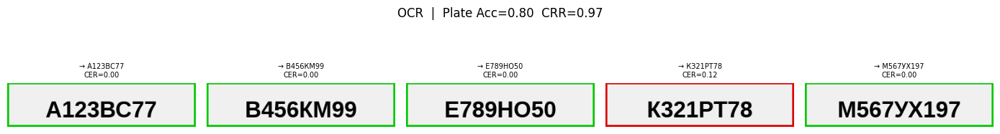

In [20]:
# ── Визуализация OCR ─────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, len(test_plates), figsize=(14, 2.5))
for i, (text, r) in enumerate(zip(test_plates, results_ocr)):
    plate = make_plate_img(text)
    color = (0,200,0) if r['reference']==r['recognized'] else (0,0,220)
    cv2.rectangle(plate, (0,0), (plate.shape[1]-1, plate.shape[0]-1), color, 3)
    axes[i].imshow(cv2.cvtColor(plate, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f'→ {r["recognized"]}\nCER={r["cer"]:.2f}', fontsize=7)
    axes[i].axis('off')
plt.suptitle(f'OCR  |  Plate Acc={plate_acc:.2f}  CRR={1-mean_cer:.2f}')
plt.tight_layout()
plt.savefig(str(OUTPUT_DIR / 'ocr_results.png'), dpi=130, bbox_inches='tight'); plt.show()

In [21]:
# ── Итоговая таблица ─────────────────────────────────────────────────────────
import pandas as pd

det = {}
det_json = OUTPUT_DIR / 'detection_metrics.json'
if det_json.exists():
    with open(det_json) as f: det = json.load(f)

table = pd.DataFrame({
    'Модуль':   ['Детекция ТС (YOLOv8n COCO)', 'Детекция номеров (YOLOv8n)', 'OCR (EasyOCR)'],
    'Метрика':  ['mAP@0.5 (pretrained)', 'mAP@0.5 (fine-tuned)', 'Plate Acc / CRR'],
    'Значение': [
        '~0.503 (COCO val)',
        str(det.get('map50', 'обучите детектор выше')),
        f'{plate_acc:.3f} / {1-mean_cer:.3f}',
    ],
})
print('─' * 62)
print(table.to_string(index=False))
print('─' * 62)

if IN_COLAB:
    import zipfile
    from google.colab import files
    with zipfile.ZipFile('results_01_detection.zip', 'w') as zf:
        for p in OUTPUT_DIR.glob('*'): zf.write(p, p.name)
    files.download('results_01_detection.zip')

──────────────────────────────────────────────────────────────
                    Модуль              Метрика          Значение
Детекция ТС (YOLOv8n COCO) mAP@0.5 (pretrained) ~0.503 (COCO val)
Детекция номеров (YOLOv8n) mAP@0.5 (fine-tuned)            0.8892
             OCR (EasyOCR)      Plate Acc / CRR     0.800 / 0.975
──────────────────────────────────────────────────────────────


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [22]:
# ── TensorBoard: вручную пишем метрики из results.csv ─────────────────────────
# YOLOv8 не всегда генерирует event-файлы автоматически;
# читаем results.csv и пишем через SummaryWriter.
import pandas as pd
from torch.utils.tensorboard import SummaryWriter

_save_dir = Path(plate_model.trainer.save_dir)
_csv_path = _save_dir / 'results.csv'
_tb_dir   = WORK_DIR / 'runs' / 'tb_plates'

if _csv_path.exists():
    _df = pd.read_csv(_csv_path)
    _df.columns = _df.columns.str.strip()

    writer = SummaryWriter(log_dir=str(_tb_dir))
    _metric_cols = [c for c in _df.columns if c != 'epoch']
    for _, row in _df.iterrows():
        ep = int(row['epoch'])
        for col in _metric_cols:
            if pd.notna(row[col]):
                writer.add_scalar(col.strip(), float(row[col]), ep)
    writer.flush()
    writer.close()
    print(f'TensorBoard логи записаны → {_tb_dir}')
else:
    print('results.csv не найден — пропускаем логирование')

%reload_ext tensorboard
%tensorboard --logdir {str(_tb_dir)}

TensorBoard логи записаны → diploma_01_detection/runs/tb_plates


<IPython.core.display.Javascript object>